<p style="text-align:center">
    <a href="https://skills.network/?utm_medium=Exinfluencer&utm_source=Exinfluencer&utm_content=000026UJ&utm_term=10006555&utm_id=NA-SkillsNetwork-Channel-SkillsNetworkCoursesIBMDS0321ENSkillsNetwork26802033-2022-01-01" target="_blank">
    <img src="https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/assets/logos/SN_web_lightmode.png" width="200" alt="Skills Network Logo">
    </a>
</p>


# **Space X  Falcon 9 First Stage Landing Prediction**


## Hands on Lab: Complete the Machine Learning Prediction lab


Estimated time needed: **60** minutes


Space X advertises Falcon 9 rocket launches on its website with a cost of 62 million dollars; other providers cost upward of 165 million dollars each, much of the savings is because Space X can reuse the first stage. Therefore if we can determine if the first stage will land, we can determine the cost of a launch. This information can be used if an alternate company wants to bid against space X for a rocket launch.   In this lab, you will create a machine learning pipeline  to predict if the first stage will land given the data from the preceding labs.


![](https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/api/Images/landing_1.gif)


Several examples of an unsuccessful landing are shown here:


![](https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBMDeveloperSkillsNetwork-DS0701EN-SkillsNetwork/api/Images/crash.gif)


Most unsuccessful landings are planed. Space X; performs a controlled landing in the oceans.


## Objectives


Perform exploratory  Data Analysis and determine Training Labels

*   create a column for the class
*   Standardize the data
*   Split into training data and test data

\-Find best Hyperparameter for SVM, Classification Trees and Logistic Regression

*   Find the method performs best using test data


## Import Libraries and Define Auxiliary Functions


In [1]:
# import piplite
# await piplite.install(['numpy'])
# await piplite.install(['pandas'])
# await piplite.install(['seaborn'])

We will import the following libraries for the lab


In [2]:
# Pandas is a software library written for the Python programming language for data manipulation and analysis.
import pandas as pd
# NumPy is a library for the Python programming language, adding support for large, multi-dimensional arrays and matrices, along with a large collection of high-level mathematical functions to operate on these arrays
import numpy as np
# Matplotlib is a plotting library for python and pyplot gives us a MatLab like plotting framework. We will use this in our plotter function to plot data.
import matplotlib.pyplot as plt
#Seaborn is a Python data visualization library based on matplotlib. It provides a high-level interface for drawing attractive and informative statistical graphics
import seaborn as sns
# Preprocessing allows us to standarsize our data
from sklearn import preprocessing
# Allows us to split our data into training and testing data
from sklearn.model_selection import train_test_split
# Allows us to test parameters of classification algorithms and find the best one
from sklearn.model_selection import GridSearchCV
# Logistic Regression classification algorithm
from sklearn.linear_model import LogisticRegression
# Support Vector Machine classification algorithm
from sklearn.svm import SVC
# Decision Tree classification algorithm
from sklearn.tree import DecisionTreeClassifier
# K Nearest Neighbors classification algorithm
from sklearn.neighbors import KNeighborsClassifier
from tqdm import tqdm

This function is to plot the confusion matrix.


In [3]:
def plot_confusion_matrix(y,y_predict, model):
    "this function plots the confusion matrix"
    from sklearn.metrics import confusion_matrix

    cm = confusion_matrix(y, y_predict)
    ax= plt.subplot()
    sns.heatmap(cm, annot=True, ax = ax); #annot=True to annotate cells
    ax.set_xlabel('Predicted labels')
    ax.set_ylabel('True labels')
    ax.set_title(f'{model} - Confusion Matrix'); 
    ax.xaxis.set_ticklabels(['did not land', 'land']); ax.yaxis.set_ticklabels(['did not land', 'landed']) 
    plt.show() 

## Load the dataframe


Load the data


In [4]:
# from js import fetch
# import io

URL1 = "https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/datasets/dataset_part_2.csv"
# resp1 = await fetch(URL1)
# text1 = io.BytesIO((await resp1.arrayBuffer()).to_py())
# data = pd.read_csv(text1)
data = pd.read_csv(URL1)

In [5]:
data.head()

,FlightNumber,Date,BoosterVersion,PayloadMass,Orbit,LaunchSite,Outcome,Flights,GridFins,Reused,Legs,LandingPad,Block,ReusedCount,Serial,Longitude,Latitude,Class
0,1,2010-06-04,Falcon 9,6104.959412,LEO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0003,-80.577366,28.561857,0
1,2,2012-05-22,Falcon 9,525.000000,LEO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0005,-80.577366,28.561857,0
2,3,2013-03-01,Falcon 9,677.000000,ISS,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B0007,-80.577366,28.561857,0
3,4,2013-09-29,Falcon 9,500.000000,PO,VAFB SLC 4E,False Ocean,1,False,False,False,NaN,1.0,0,B1003,-120.610829,34.632093,0
4,5,2013-12-03,Falcon 9,3170.000000,GTO,CCAFS SLC 40,None None,1,False,False,False,NaN,1.0,0,B1004,-80.577366,28.561857,0


In [6]:
URL2 = 'https://cf-courses-data.s3.us.cloud-object-storage.appdomain.cloud/IBM-DS0321EN-SkillsNetwork/datasets/dataset_part_3.csv'
# resp2 = await fetch(URL2)
# text2 = io.BytesIO((await resp2.arrayBuffer()).to_py())
# X = pd.read_csv(text2)
X = pd.read_csv(URL2)

In [7]:
X.head(100)

,FlightNumber,PayloadMass,Flights,Block,ReusedCount,Orbit_ES-L1,Orbit_GEO,Orbit_GTO,Orbit_HEO,Orbit_ISS,...,Serial_B1058,Serial_B1059,Serial_B1060,Serial_B1062,GridFins_False,GridFins_True,Reused_False,Reused_True,Legs_False,Legs_True
0,1.0,6104.959412,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
1,2.0,525.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
2,3.0,677.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,1.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
3,4.0,500.000000,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
4,5.0,3170.000000,1.0,1.0,0.0,0.0,0.0,1.0,0.0,0.0,...,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
85,86.0,15400.000000,2.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
86,87.0,15400.000000,3.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,...,1.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
87,88.0,15400.000000,6.0,5.0,5.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0
88,89.0,15400.000000,3.0,5.0,2.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,1.0,0.0,0.0,1.0,0.0,1.0,0.0,1.0


In [8]:
results_list = {}

## TASK  1


Create a NumPy array from the column <code>Class</code> in <code>data</code>, by applying the method <code>to_numpy()</code>  then
assign it  to the variable <code>Y</code>,make sure the output is a  Pandas series (only one bracket df\['name of  column']).


In [9]:
Y = data['Class'].to_numpy()
Y

array([0, 0, 0, 0, 0, 0, 1, 1, 0, 0, 0, 0, 1, 0, 0, 0, 1, 0, 0, 1, 1, 1,
       1, 1, 0, 1, 1, 0, 1, 1, 0, 1, 1, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 0, 0, 0, 1, 1, 0, 0, 1, 1, 1, 1, 1, 1, 1, 0, 0, 1, 1, 1, 1, 1,
       1, 0, 1, 1, 1, 1, 0, 1, 0, 1, 0, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1])

## TASK  2


Standardize the data in <code>X</code> then reassign it to the variable  <code>X</code> using the transform provided below.


In [10]:
# students get this 
transform = preprocessing.StandardScaler()
X = transform.fit_transform(X)

We split the data into training and testing data using the  function  <code>train_test_split</code>.   The training data is divided into validation data, a second set used for training  data; then the models are trained and hyperparameters are selected using the function <code>GridSearchCV</code>.


## TASK  3


Use the function train_test_split to split the data X and Y into training and test data. Set the parameter test_size to  0.2 and random_state to 2. The training data and test data should be assigned to the following labels.


<code>X_train, X_test, Y_train, Y_test</code>


In [11]:
# X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=0.2)

we can see we only have 18 test samples.


In [12]:
# Y_test.shape

## TASK  4


Create a logistic regression object  then create a  GridSearchCV object  <code>logreg_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [13]:
parameters ={'C':[0.01,0.1,1],
             'penalty':['l2'],
             'solver':['lbfgs']}

In [14]:
def train_lr(temp_X_train, temp_X_test, temp_Y_train, temp_Y_test):
    parameters ={"C":[0.01,0.1,1],'penalty':['l2'], 'solver':['lbfgs']}# l1 lasso l2 ridge
    lr=LogisticRegression()
    logreg_cv = GridSearchCV(
        estimator=lr,
        param_grid=parameters,
        cv=10,
        scoring='accuracy',
        verbose=2
    )
    logreg_cv.fit(temp_X_train, temp_Y_train)

    # print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
    # print("accuracy :",logreg_cv.best_score_)

    # lr_test_score = logreg_cv.score(temp_X_test, temp_Y_test)
    # print(lr_test_score)

    return logreg_cv

In [15]:
# logreg_cv = train_lr(X_train, X_test, Y_train, Y_test)

We output the <code>GridSearchCV</code> object for logistic regression. We display the best parameters using the data attribute <code>best_params\_</code> and the accuracy on the validation data using the data attribute <code>best_score\_</code>.


In [16]:
# print("tuned hpyerparameters :(best parameters) ",logreg_cv.best_params_)
# print("accuracy :",logreg_cv.best_score_)

## TASK  5


Calculate the accuracy on the test data using the method <code>score</code>:


In [17]:
# lr_test_score = logreg_cv.score(X_test, Y_test)
# print(lr_test_score)

In [18]:
# results_list["Linear Regression"] = lr_test_score

Lets look at the confusion matrix:


In [19]:
# yhat=logreg_cv.predict(X_test)
# plot_confusion_matrix(Y_test,yhat, "Linear Regression")

Examining the confusion matrix, we see that logistic regression can distinguish between the different classes.  We see that the problem is false positives.

Overview:

True Postive - 12 (True label is landed, Predicted label is also landed)

False Postive - 3 (True label is not landed, Predicted label is landed)


## TASK  6


Create a support vector machine object then  create a  <code>GridSearchCV</code> object  <code>svm_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [20]:
svm_parameters = {'kernel':('linear', 'rbf','poly','rbf', 'sigmoid'),
              'C': np.logspace(-3, 3, 5),
              'gamma':np.logspace(-3, 3, 5)}
svm = SVC()

In [21]:
def train_svm(temp_X_train, temp_X_test, temp_Y_train, temp_Y_test):
    temp_svm_parameters = {'kernel':('linear', 'rbf','poly','rbf', 'sigmoid'),
              'C': np.logspace(-3, 3, 5),
              'gamma':np.logspace(-3, 3, 5)}
    temp_svm = SVC()

    svm_cv = GridSearchCV(
        estimator=temp_svm,
        param_grid=temp_svm_parameters,
        cv=10,
        scoring="accuracy",
        verbose=2
    )
    svm_cv.fit(temp_X_train, temp_Y_train)

    # print("tuned hpyerparameters :(best parameters) ",svm_cv.best_params_)
    # print("accuracy :",svm_cv.best_score_)

    # svm_score = svm_cv.score(temp_Y_train, temp_Y_test)
    # print(svm_score)
    return svm_cv

In [49]:
temp_X_train1, temp_X_test1, temp_y_train1, temp_y_test1 = train_test_split(X, Y, test_size=0.2, random_state=45)
svm_cv = train_svm(temp_X_train1, temp_X_test1, temp_y_train1, temp_y_test1)

Fitting 10 folds for each of 125 candidates, totalling 1250 fits
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ................C=0.001, gamma=0.001, kernel=linear; total time=   0.0s
[CV] END ...................C=0.001, gamma=0.001, kernel=rbf; total time=   0.0s
[CV] END ...................C=0.001, gamma=0

In [23]:
# print("tuned hpyerparameters :(best parameters) ",svm_cv.best_params_)
# print("accuracy :",svm_cv.best_score_)

## TASK  7


Calculate the accuracy on the test data using the method <code>score</code>:


In [24]:
# svm_score = svm_cv.score(X_test, Y_test)
# print(svm_score)

In [25]:
# results_list["SVM"] = svm_score

We can plot the confusion matrix


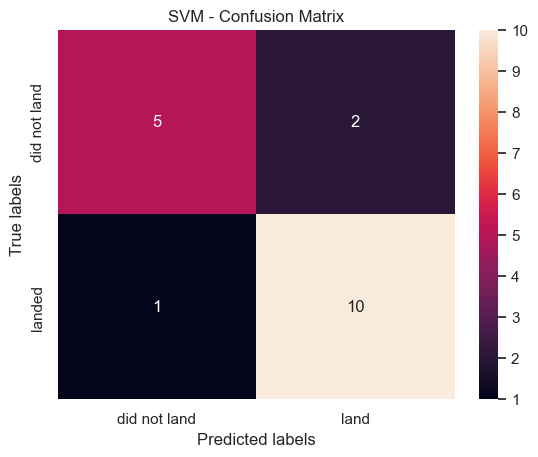

In [50]:
yhat=svm_cv.predict(temp_X_test1)
plot_confusion_matrix(temp_y_test1,yhat, "SVM")

## TASK  8


Create a decision tree classifier object then  create a  <code>GridSearchCV</code> object  <code>tree_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [27]:
tree_parameters = {'criterion': ['gini', 'entropy'],
     'splitter': ['best', 'random'],
     'max_depth': [2*n for n in range(1,10)],
     # 'max_features': ['auto', 'sqrt'],
     'max_features': ['sqrt', 'log2'],
     'min_samples_leaf': [1, 2, 4],
     'min_samples_split': [2, 5, 10]}

tree = DecisionTreeClassifier()

In [28]:
def train_tree(temp_X_train, temp_X_test, temp_Y_train, temp_Y_test):
    temp_tree_parameters = {'criterion': ['gini', 'entropy'],
        'splitter': ['best', 'random'],
        'max_depth': [2*n for n in range(1,10)],
        # 'max_features': ['auto', 'sqrt'],
        'max_features': ['sqrt', 'log2'],
        'min_samples_leaf': [1, 2, 4],
        'min_samples_split': [2, 5, 10]
    }

    temp_tree = DecisionTreeClassifier()

    tree_cv = GridSearchCV(
        estimator=temp_tree,
        param_grid=temp_tree_parameters,
        cv=10,
        scoring='accuracy',
        verbose=2
    )
    tree_cv.fit(temp_X_train, temp_Y_train)

    # print("tuned hpyerparameters :(best parameters) ",tree_cv.best_params_)
    # print("accuracy :",tree_cv.best_score_)

    # tree_score = tree_cv.score(temp_X_test, temp_Y_test)
    # print(tree_score)
    
    return tree_cv

In [29]:
# tree_cv = train_tree(X_train, X_test, Y_train, Y_test)

In [30]:
# print("tuned hpyerparameters :(best parameters) ",tree_cv.best_params_)
# print("accuracy :",tree_cv.best_score_)

## TASK  9


Calculate the accuracy of tree_cv on the test data using the method <code>score</code>:


In [31]:
# tree_score = tree_cv.score(X_test, Y_test)
# print(tree_score)

In [32]:
# results_list["Decision Tree"] = tree_score

We can plot the confusion matrix


In [33]:
# yhat = tree_cv.predict(X_test)
# plot_confusion_matrix(Y_test,yhat, "Decision Tree")

## TASK  10


Create a k nearest neighbors object then  create a  <code>GridSearchCV</code> object  <code>knn_cv</code> with cv = 10.  Fit the object to find the best parameters from the dictionary <code>parameters</code>.


In [34]:
knn_parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
              'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
              'p': [1,2]}

KNN = KNeighborsClassifier()

In [35]:
def train_knn(temp_X_train, temp_X_test, temp_Y_train, temp_Y_test):
    temp_knn_parameters = {'n_neighbors': [1, 2, 3, 4, 5, 6, 7, 8, 9, 10],
                'algorithm': ['auto', 'ball_tree', 'kd_tree', 'brute'],
                'p': [1,2]
        }

    temp_KNN = KNeighborsClassifier()

    knn_cv = GridSearchCV(
        estimator=temp_KNN,
        param_grid=temp_knn_parameters,
        cv=10,
        scoring='accuracy',
        verbose=2
    )
    knn_cv.fit(temp_X_train, temp_Y_train)

    # print("tuned hpyerparameters :(best parameters) ",knn_cv.best_params_)
    # print("accuracy :",knn_cv.best_score_)

    # knn_score = knn_cv.score(temp_X_test, temp_Y_test)
    # print(knn_score)    

    return knn_cv

In [36]:
# knn_cv = train_knn(X_train, X_test, Y_train, Y_test)

In [37]:
# print("tuned hpyerparameters :(best parameters) ",knn_cv.best_params_)
# print("accuracy :",knn_cv.best_score_)

## TASK  11


Calculate the accuracy of knn_cv on the test data using the method <code>score</code>:


In [38]:
# knn_score = knn_cv.score(X_test, Y_test)
# print(knn_score)

In [39]:
# results_list["KNN"] = knn_score

We can plot the confusion matrix


In [40]:
# yhat = knn_cv.predict(X_test)
# plot_confusion_matrix(Y_test,yhat, "KNN")

## TASK  12


Find the method performs best:


In [41]:
# print(results_list)

In [42]:
lr_name = "Linear Regression"
svm_name = "SVM"
tree_name = "Decision Tree"
knn_name = "KNN"

repeated_exp_results_dict = {
    lr_name: [],
    svm_name: [],
    tree_name: [],
    knn_name: [],
}

# Run 10 trials
trial_num = 10
for _ in tqdm(range(trial_num), desc="Running model evaluations"):
    temp_X_train, temp_X_test, temp_y_train, temp_y_test = train_test_split(X, Y, test_size=0.2)
    
    # train and test models
    temp_lr_model = train_lr(temp_X_train, temp_X_test, temp_y_train, temp_y_test)
    repeated_exp_results_dict[lr_name].append(temp_lr_model.score(temp_X_test, temp_y_test))

    temp_svm_model = train_svm(temp_X_train, temp_X_test, temp_y_train, temp_y_test)
    repeated_exp_results_dict[svm_name].append(temp_svm_model.score(temp_X_test, temp_y_test))

    temp_tree_model = train_tree(temp_X_train, temp_X_test, temp_y_train, temp_y_test)
    repeated_exp_results_dict[tree_name].append(temp_tree_model.score(temp_X_test, temp_y_test))

    temp_knn_model = train_knn(temp_X_train, temp_X_test, temp_y_train, temp_y_test)
    repeated_exp_results_dict[knn_name].append(temp_knn_model.score(temp_X_test, temp_y_test))

Running model evaluations:   0%|          | 0/10 [00:00<?, ?it/s]

Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ....................C=0.1, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ....................C=0.1, penalty=l2, 

Running model evaluations:  10%|█         | 1/10 [00:22<03:20, 22.33s/it]

[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, 

Running model evaluations:  20%|██        | 2/10 [00:40<02:39, 19.97s/it]

[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algo

Running model evaluations:  30%|███       | 3/10 [00:59<02:15, 19.36s/it]

[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algo

Running model evaluations:  40%|████      | 4/10 [01:18<01:55, 19.20s/it]

[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algo

Running model evaluations:  50%|█████     | 5/10 [01:36<01:34, 18.93s/it]

[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algo

Running model evaluations:  60%|██████    | 6/10 [01:55<01:15, 18.82s/it]

[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, 

Running model evaluations:  70%|███████   | 7/10 [02:13<00:56, 18.71s/it]

[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
Fitting 10 folds for each of 3 candidates, totalling 30 fits
[CV] END ...................C=0.01, penalty=l2, solver=lbfgs; total time=   0.0s
[CV] END ...................C=0.01, penalty=l2, 

Running model evaluations:  80%|████████  | 8/10 [02:32<00:37, 18.67s/it]

[CV] END ................algorithm=brute, n_neighbors=9, p=1; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=1; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=1; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=1; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=1; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................alg

Running model evaluations:  90%|█████████ | 9/10 [02:50<00:18, 18.52s/it]

[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ................algorithm=brute, n_neighbors=9, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=1; total time=   0.0s
[CV] END ...............algo

Running model evaluations: 100%|██████████| 10/10 [03:08<00:00, 18.87s/it]

[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s
[CV] END ...............algorithm=brute, n_neighbors=10, p=2; total time=   0.0s


In [43]:
mean_accuracy_dict = {}
for mdl_name, mdl_results in repeated_exp_results_dict.items():
    mean_accuracy_dict[mdl_name] = np.mean(mdl_results)

In [44]:
def display_model_compare(data):
    # Convert to DataFrame
    temp_df = pd.DataFrame(list(data.items()), columns=['Model', 'Accuracy'])

    # Set Seaborn theme
    sns.set_theme(style='whitegrid')

    # Create barplot
    plt.figure(figsize=(8, 5))
    barplot = sns.barplot(data=temp_df, x='Model', y='Accuracy', palette='Set2')

    # Annotate bars with values
    for p in barplot.patches:
        barplot.annotate(f"{p.get_height():.2f}", (p.get_x() + p.get_width() / 2, p.get_height()),
                        ha='center', va='bottom', fontsize=10, color='black')

    # Title and labels
    plt.title('Model Accuracy Comparison', fontsize=14)
    plt.ylim(0, 1.05)
    plt.ylabel('Accuracy')
    plt.xlabel('Model')

    # Show plot
    plt.tight_layout()
    plt.show()


C:\Users\Dobrilla\AppData\Local\Temp\ipykernel_16308\1239534612.py:10: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  barplot = sns.barplot(data=temp_df, x='Model', y='Accuracy', palette='Set2')


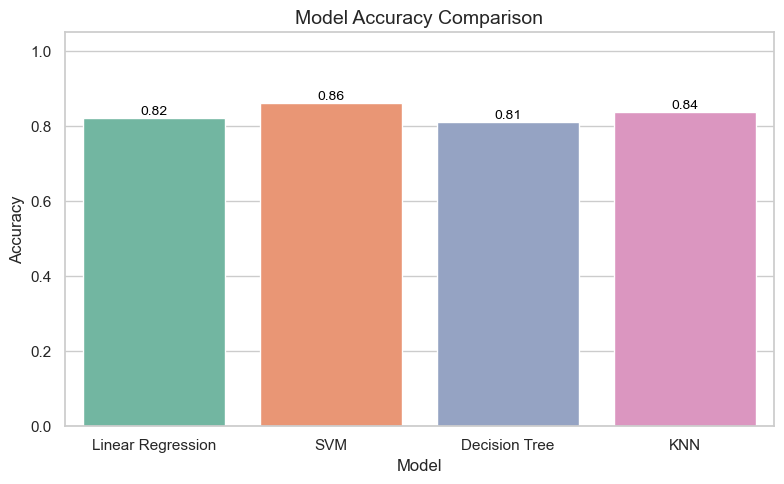

In [45]:
display_model_compare(mean_accuracy_dict)

## Authors


[Pratiksha Verma](https://www.linkedin.com/in/pratiksha-verma-6487561b1/)


<!--## Change Log--!>


<!--| Date (YYYY-MM-DD) | Version | Changed By      | Change Description      |
| ----------------- | ------- | -------------   | ----------------------- |
| 2022-11-09        | 1.0     | Pratiksha Verma | Converted initial version to Jupyterlite|--!>


### <h3 align="center"> IBM Corporation 2022. All rights reserved. <h3/>
